In [67]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso,Ridge,RidgeCV,ElasticNet,ElasticNetCV,LinearRegression,LassoCV,LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pickle
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [27]:
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv")

In [28]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [29]:
pf = ProfileReport(df)

In [5]:
pf

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

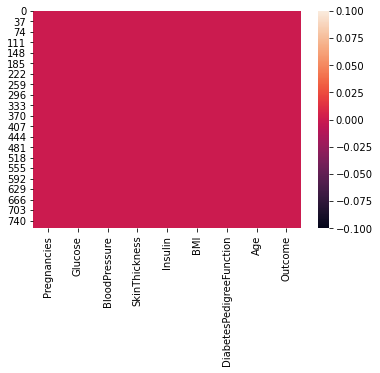

In [6]:
sns.heatmap(df.isnull())

In [30]:
column = ["Glucose","BloodPressure","SkinThickness","BMI","Insulin"]
def replaceZeroWithMean(column):
    for feature in column:
        df[feature] = df[feature].replace(0,df[feature].mean())
replaceZeroWithMean(column)
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [31]:
q = df["Pregnancies"].quantile(.98)
df_new = df[df['Pregnancies'] < q]

q = df_new["BMI"].quantile(.99)
df_new = df_new[df_new['BMI'] < q]

q = df_new["Age"].quantile(.98)
df_new = df_new[df_new['Age'] < q]

q = df_new["SkinThickness"].quantile(.98)
df_new = df_new[df_new['SkinThickness'] < q]

q = df_new["BloodPressure"].quantile(.98)
df_new = df_new[df_new['BloodPressure'] < q]

q = df_new["Insulin"].quantile(.95)
df_new = df_new[df_new['Insulin'] < q]

<AxesSubplot:>

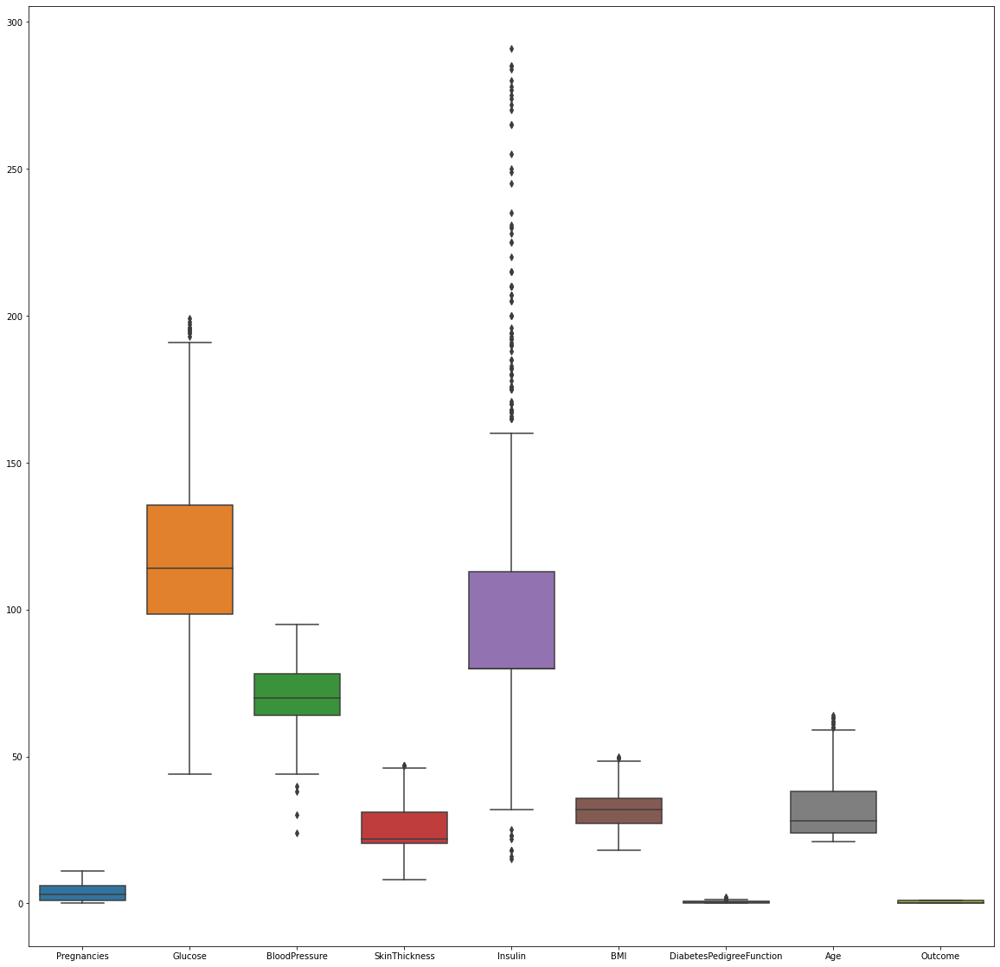

In [32]:
fig,ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new,ax = ax)

In [33]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
762,9,89.0,62.0,20.536458,79.799479,22.5,0.142,33,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [36]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [34]:
y = df_new["Outcome"]
x = df_new.drop(columns=["Outcome"])

In [35]:
x

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33
...,...,...,...,...,...,...,...,...
762,9,89.0,62.0,20.536458,79.799479,22.5,0.142,33
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47


In [36]:
scaler = StandardScaler()
scaled_x = scaler.fit_transform(x)
scaled_x_df = pd.DataFrame(scaled_x,columns = x.columns)


<AxesSubplot:>

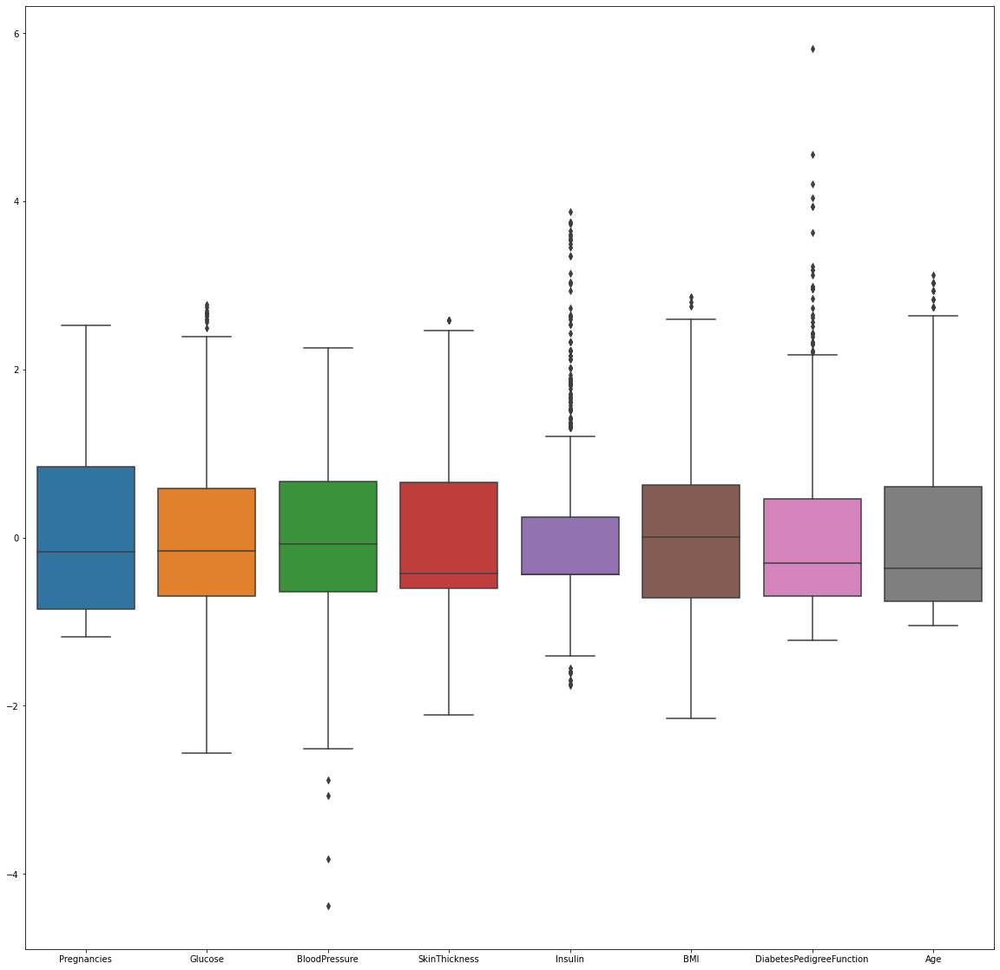

In [37]:
fig,ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = scaled_x_df,ax=ax)

In [38]:
vif_df = pd.DataFrame()
vif_df["vif"] = [ variance_inflation_factor(scaled_x,i) for i in range(x.shape[1])]
vif_df["columns"] = x.columns

In [39]:
vif_df

,vif,columns
0,1.487993,Pregnancies
1,1.301477,Glucose
2,1.251121,BloodPressure
3,1.471497,SkinThickness
4,1.255797,Insulin
5,1.550031,BMI
6,1.050772,DiabetesPedigreeFunction
7,1.674246,Age


In [40]:
x_train,x_test,y_train,y_test = train_test_split(scaled_x,y,test_size = .20,random_state = 144)

In [41]:
x_test[0]

array([ 0.16576124,  0.32458552, -0.07966579, -0.60449279, -0.43416698,
        0.38685641, -0.50341455, -0.75314852])

In [42]:
logr = LogisticRegression(verbose = 1)
logr.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [48]:
logr.predict_proba([x_test[10]])

array([[0.79438352, 0.20561648]])

In [43]:
logr.predict([x_test[10]])

array([0], dtype=int64)

In [44]:
logr_liblinear = LogisticRegression(solver = 'liblinear')

In [45]:
logr_liblinear.fit(x_train,y_train)

LogisticRegression(solver='liblinear')

In [49]:
logr_pred_defualt = logr.predict(x_test)

In [46]:
logr_pred_liblinear = logr_liblinear.predict(x_test)

In [47]:
logr_pred_liblinear

array([0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0],
      dtype=int64)

In [51]:
logr_pred_defualt


array([0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0],
      dtype=int64)

In [53]:
confusion_matrix(y_test,logr_pred_defualt)

array([[84, 10],
       [20, 17]], dtype=int64)

In [57]:
confusion_matrix(y_test,logr_pred_liblinear)

array([[83, 11],
       [20, 17]], dtype=int64)

In [60]:
def model_eval(y_test,y_pred):
    tp,tn,fp,fn = confusion_matrix(y_test,y_pred).ravel()
    accuracy = (tp+tn)/(tp+tn+fp+fn)
    precision = tp/(tp+fp)
    recall = tp/(tp+fn)
    specificity = tn/(fp+tn)
    f1_score = 2*(recall*precision)/(recall+precision)
    result ={"Accuracy":accuracy,"precision":precision,"recall": recall,"specificity":specificity,"F1_score":f1_score}
    return result

In [61]:
model_eval(y_test,logr_pred_liblinear)

{'Accuracy': 0.7175572519083969,
 'precision': 0.8058252427184466,
 'recall': 0.83,
 'specificity': 0.3548387096774194,
 'F1_score': 0.8177339901477833}

In [64]:
roc_auc_score(y_test,logr_pred_defualt)

0.6765382403680276

In [65]:
roc_auc_score(y_test,logr_pred_liblinear)

0.6712190914318574

In [69]:
fpr,tpr,threshhold = roc_curve(y_test,logr_pred_liblinear)

In [70]:
fpr

array([0.        , 0.11702128, 1.        ])

In [71]:
tpr

array([0.        , 0.45945946, 1.        ])

In [72]:
threshhold

array([2, 1, 0], dtype=int64)